In [ ]:
# analyses of the influence of the square area of interest on the values of radiomic features

In [1]:
from radiomics import featureextractor
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
import json, codecs
import numpy as np

In [2]:
imagesPath = os.path.join('..', 'data', 'square influence')
masksShortPath = os.path.join('..', 'data', 'masks short')
masksLongPath = os.path.join('..', 'data', 'masks long')
resultsPath = os.path.join(imagesPath, 'results')


imagePath = os.path.join(imagesPath, 'image.dcm')
image = sitk.ReadImage(imagePath)

In [3]:
# Numpy arrays are not json serializable
def jsonifyDict(dictWithNumpyArrays):
    for feature, value in dictWithNumpyArrays.items():
        if type(value) is np.ndarray:
            dictWithNumpyArrays[feature] = value.tolist()

In [4]:
def saveJson(data, fileName):
    file = codecs.open(os.path.join(resultsPath, fileName), 'w', encoding='utf-8')
    json.dump(data, 
          file,
          separators=(',', ':'), 
          sort_keys=False, 
          indent=4)
    file.close()

In [5]:
def cropDict(dictionary, keys=['original_']):
    cropped = {}
    for k in keys:
        for key, value in dictionary.items():
            if key.startswith(k):
                cropped[key] = value
    
    return cropped

In [6]:
def loadJson(fileName):
    file = codecs.open(os.path.join(resultsPath, fileName), 'r', encoding='utf-8')
    data =  json.load(file)
    file.close()
    return data

In [7]:
extractor = featureextractor.RadiomicsFeatureExtractor()
extractor.disableAllFeatures()
extractor.enableFeatureClassByName('firstorder')
extractor.enableFeatureClassByName('glcm')
extractor.enableFeatureClassByName('glrlm')
extractor.enableFeatureClassByName('glszm')
extractor.enableFeatureClassByName('gldm')
extractor.enableFeatureClassByName('ngtdm')

In [8]:
extractor.enabledFeatures

{'firstorder': [],
 'glcm': [],
 'glrlm': [],
 'glszm': [],
 'gldm': [],
 'ngtdm': []}

In [ ]:
resultsShort = []

for maskFileNumber in range(1, len(os.listdir(masksShortPath))):
    mask = sitk.ReadImage(os.path.join(masksShortPath, str(1 + 2*maskFileNumber) + '.dcm'))
    resultsShort.append(extractor.execute(image, mask))

In [9]:
def helper(results):
    results.insert(0, cropDict(results[0], ['diagnostics_V', 'diagnostics_C', 'diagnostics_I']))
    results[1:] = [cropDict(result) for result in results[1:]]
    for result in results:
        jsonifyDict(result)

In [11]:
helper(resultsShort)
saveJson(resultsShort, 'resultsShort.json')

In [10]:
resultsShort = loadJson('resultsShort.json')

In [11]:
xAxisValuesShort = [value for value in range(3, 145, 2)]
xAxisValuesLong = [value for value in range(9, 20450)]

In [12]:
import re
def fixTitle(featureName):
    featureName = featureName.replace('original_', '')
    featureName = featureName.replace('_', ' ')
    featureNameList = featureName.split(' ')
    featureName = featureNameList[0].upper() + ': ' +  re.sub(r"(?<=\w)([A-Z])", r" \1", featureNameList[1])
    
    return featureName

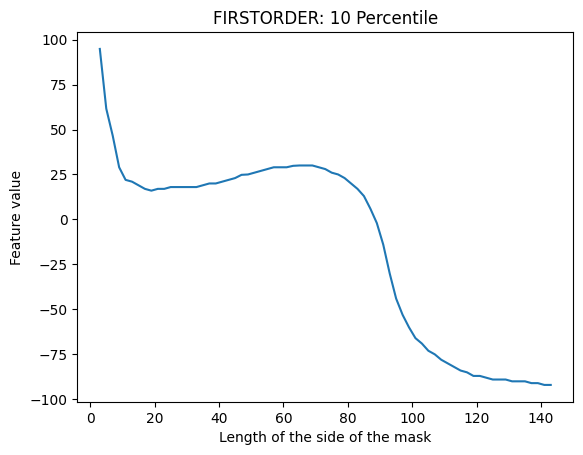

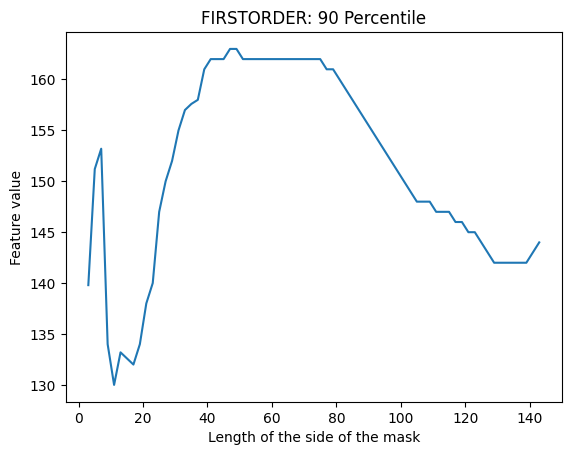

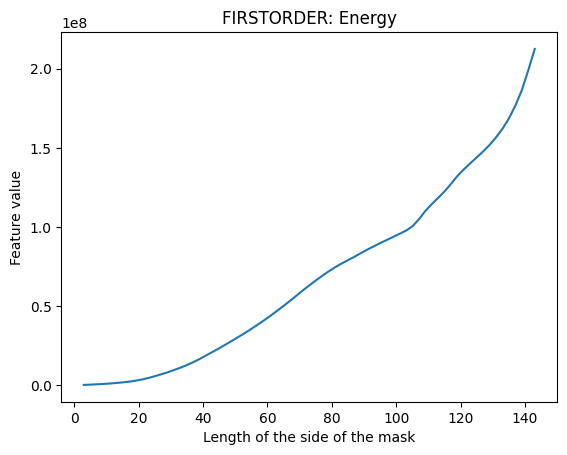

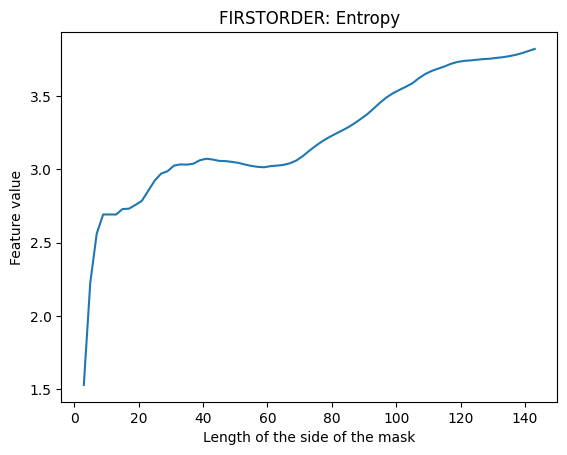

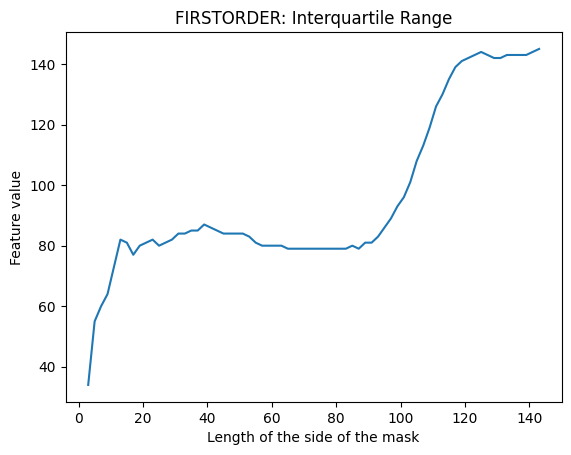

...

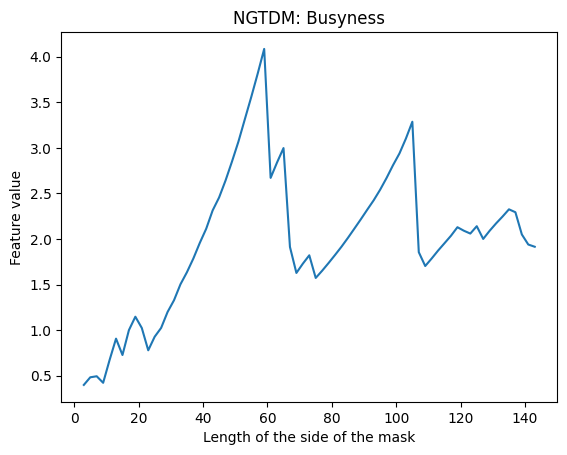

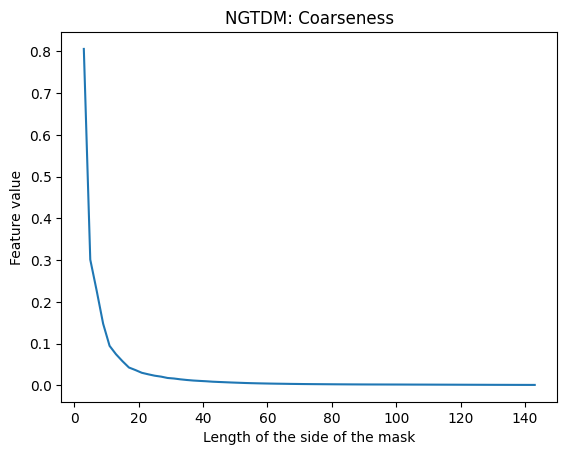

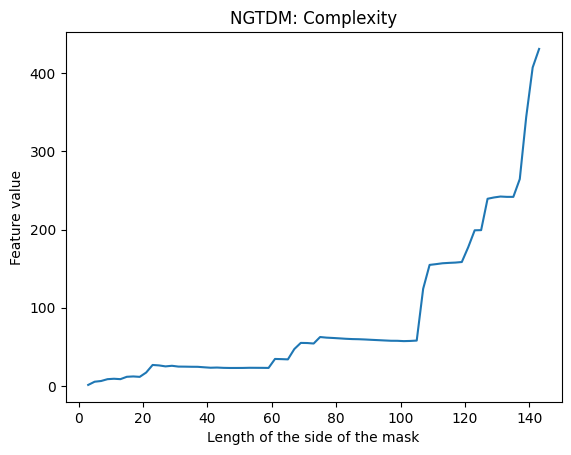

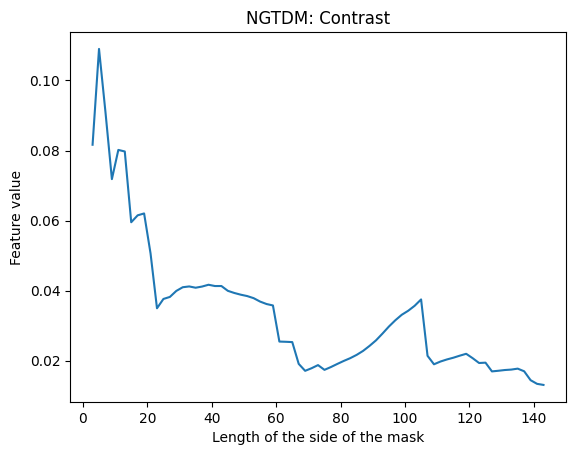

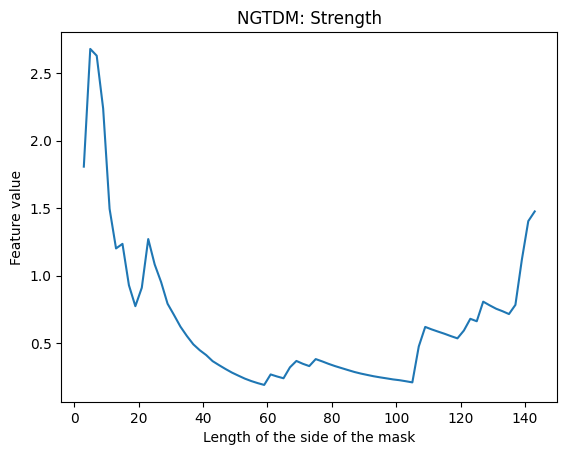

In [13]:
resultsShortForPlot = {}
for key in resultsShort[1].keys():
    plt.title(fixTitle(key))
    feature = []
    for dictionary in resultsShort[1:]:
        feature.append(dictionary[key])
    
    resultsShortForPlot[key] = feature
    
    plt.plot(xAxisValuesShort, feature)
    plt.xlabel('Length of the side of the mask')
    plt.ylabel('Feature value')
    plt.show()

In [75]:
mask = sitk.ReadImage(os.path.join(masksShortPath, '95.dcm'))
imagePlusOne = sitk.ReadImage(os.path.join(imagesPath, 'image+1.dcm'))
imagePlusTwo = sitk.ReadImage(os.path.join(imagesPath, 'image+2.dcm'))
imageMinusOne = sitk.ReadImage(os.path.join(imagesPath, 'image-1.dcm'))
imageMinusTwo = sitk.ReadImage(os.path.join(imagesPath, 'image-2.dcm'))

In [ ]:
resultsSlices = {}

resultsSlices['image'] = extractor.execute(image, mask)
resultsSlices['imagePlusOne'] = extractor.execute(imagePlusOne, mask)
resultsSlices['imagePlusTwo'] = extractor.execute(imagePlusTwo, mask)
resultsSlices['imageMinusOne'] = extractor.execute(imageMinusOne, mask)
resultsSlices['imageMinusTwo'] = extractor.execute(imageMinusTwo, mask)

In [107]:
for key, sliceFeatures in resultsSlices.items():
    jsonifyDict(sliceFeatures)

saveJson(resultsSlices, 'resultsSlicesOneMask.json')

In [14]:
resultsSlices = loadJson('resultsSlicesOneMask.json')

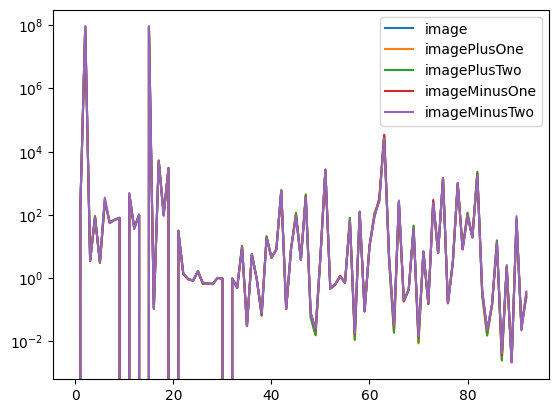

In [111]:
xAxisLabelSlices = []
for feature in resultsSlices['image'].keys():
    if feature.startswith('original'):
        xAxisLabelSlices.append(feature)

for photo, values in resultsSlices.items():
    photoValues = []
    for feature, value in values.items():
        if feature.startswith('original'):
            photoValues.append(value)
    
    plt.plot(photoValues)
    plt.yscale('log')

plt.legend(resultsSlices.keys())
plt.show()

In [ ]:
resultsImagePlusOne = []
resultsImagePlusTwo = []
resultsImageMinusOne = []
resultsImageMinusTwo = []


for maskFileNumber in range(1, len(os.listdir(masksShortPath))):
    mask = sitk.ReadImage(os.path.join(masksShortPath, str(1 + 2*maskFileNumber) + '.dcm'))
    resultsImagePlusOne.append(extractor.execute(imagePlusOne, mask))
    resultsImagePlusTwo.append(extractor.execute(imagePlusTwo, mask))
    resultsImageMinusOne.append(extractor.execute(imageMinusOne, mask))
    resultsImageMinusTwo.append(extractor.execute(imageMinusTwo, mask))

In [117]:
helper(resultsImagePlusOne)
helper(resultsImagePlusTwo)
helper(resultsImageMinusOne)
helper(resultsImageMinusTwo)

resultsMultipleImages = {'image' : resultsShort, 'imagePlusOne' : resultsImagePlusOne, 
                         'imagePlusTwo' : resultsImagePlusTwo, 'imageMinusOne' : resultsImageMinusOne,
                         'imageMinusTwo' : resultsImageMinusTwo}

In [120]:
saveJson(resultsMultipleImages, 'resultsMultipleImages.json')

In [15]:
resultsMultipleImages = loadJson('resultsMultipleImages.json')

In [26]:
def fixLegend(keys):
    newKeys = []
    for key in keys:
        newKeys.append(fixLegendKey(key))
    
    return newKeys

In [25]:
def fixLegendKey(key):
    key = key.replace('Plus', ' + ')
    key = key.replace('Minus', ' - ')
    key = key.replace('One', '1')
    key = key.replace('Two', '2')
    
    return key

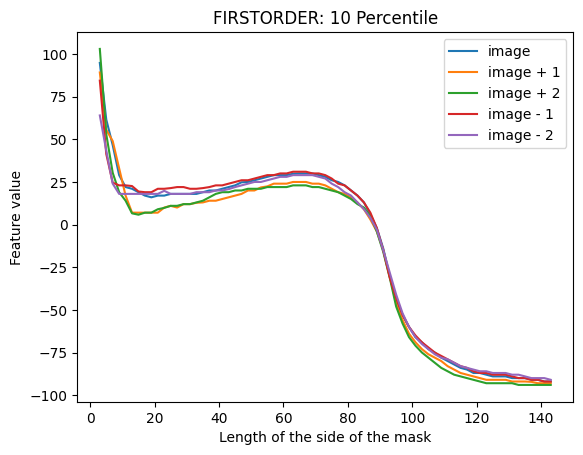

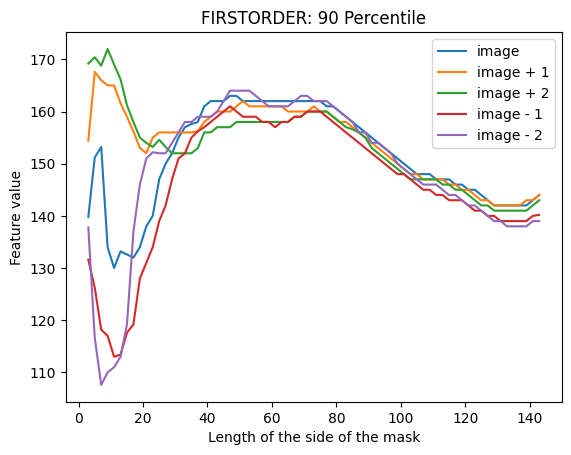

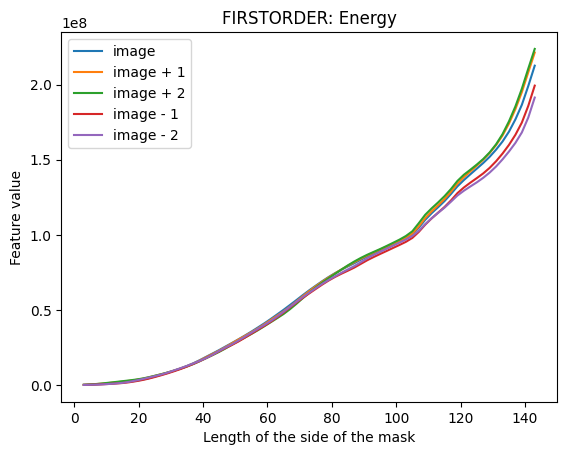

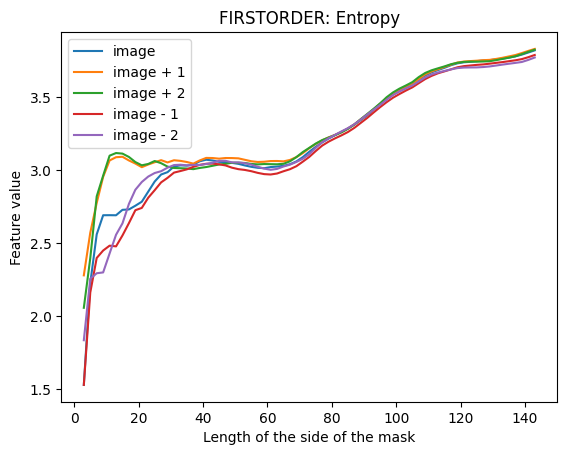

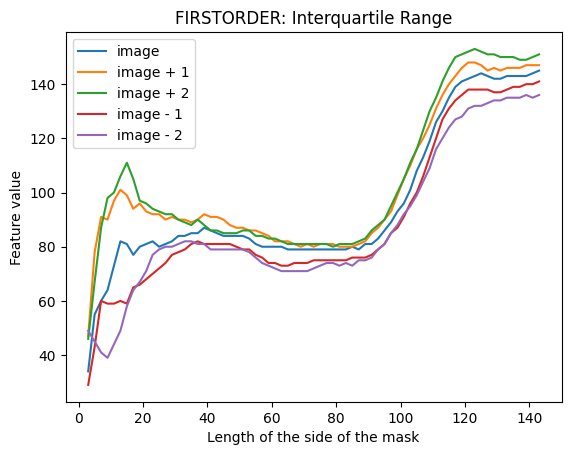

...

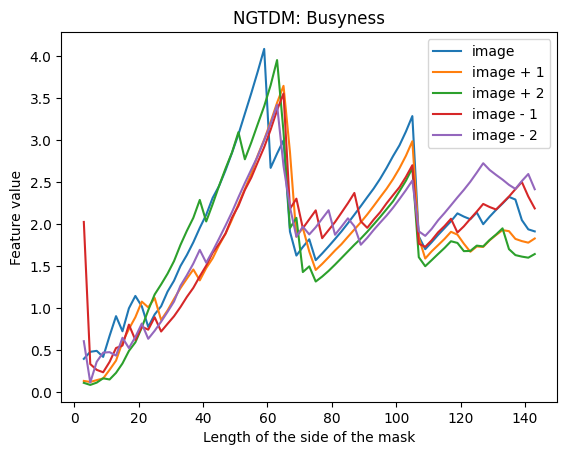

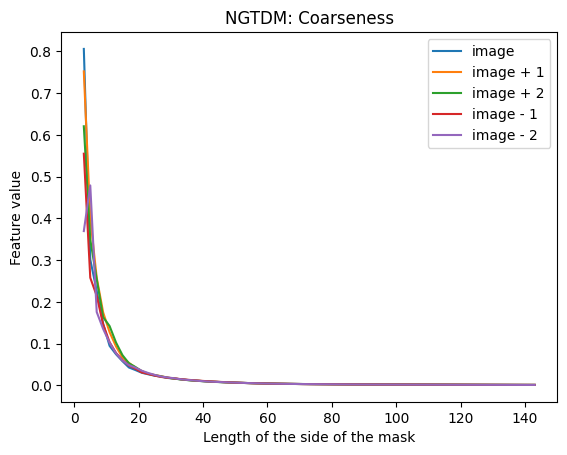

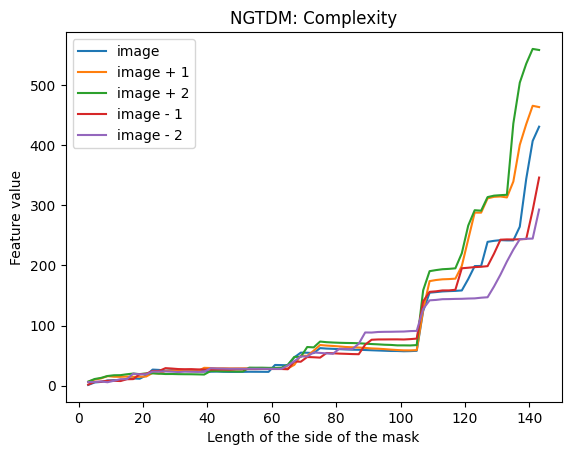

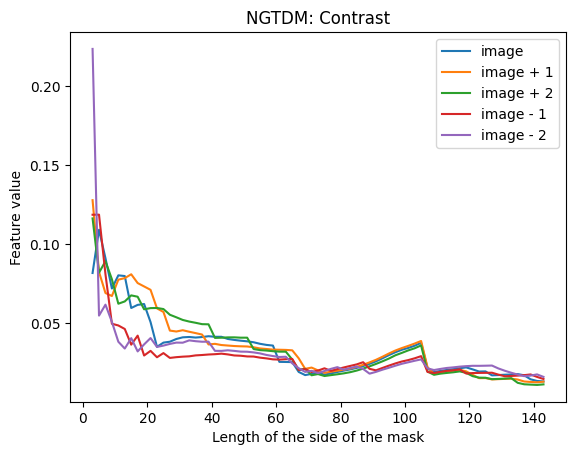

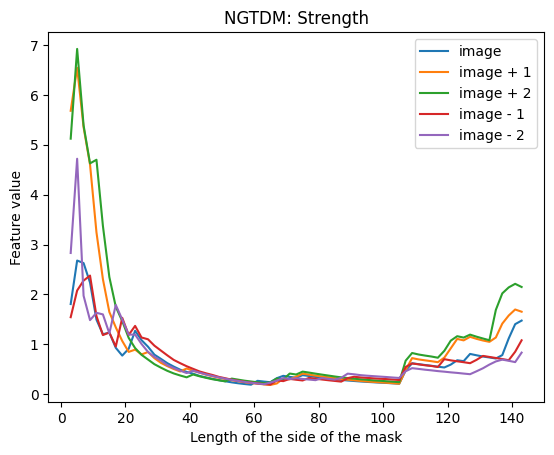

In [27]:
resultsMultipleImagesForPlot = {}
for key in resultsMultipleImages['image'][1].keys():
    plt.title(fixTitle(key))
    resultsMultipleImagesForPlot[key] = {}
    for photo, valueList in resultsMultipleImages.items():
        feature = []
        for dictionary in valueList[1:]:
            feature.append(dictionary[key])
        
        resultsMultipleImagesForPlot[key][photo] = feature
        plt.plot(xAxisValuesShort, feature)
        plt.xlabel('Length of the side of the mask')
        plt.ylabel('Feature value')
    
    plt.legend(fixLegend(resultsMultipleImages.keys()))
    plt.show()

In [20]:
resultsShortForPlot.keys()

dict_keys(['original_firstorder_10Percentile', 'original_firstorder_90Percentile', 'original_firstorder_Energy', 'original_firstorder_Entropy', 'original_firstorder_InterquartileRange', 'original_firstorder_Kurtosis', 'original_firstorder_Maximum', 'original_firstorder_MeanAbsoluteDeviation', 'original_firstorder_Mean', 'original_firstorder_Median', 'original_firstorder_Minimum', 'original_firstorder_Range', 'original_firstorder_RobustMeanAbsoluteDeviation', 'original_firstorder_RootMeanSquared', 'original_firstorder_Skewness', 'original_firstorder_TotalEnergy', 'original_firstorder_Uniformity', 'original_firstorder_Variance', 'original_glcm_Autocorrelation', 'original_glcm_ClusterProminence', 'original_glcm_ClusterShade', 'original_glcm_ClusterTendency', 'original_glcm_Contrast', 'original_glcm_Correlation', 'original_glcm_DifferenceAverage', 'original_glcm_DifferenceEntropy', 'original_glcm_DifferenceVariance', 'original_glcm_Id', 'original_glcm_Idm', 'original_glcm_Idmn', 'original_

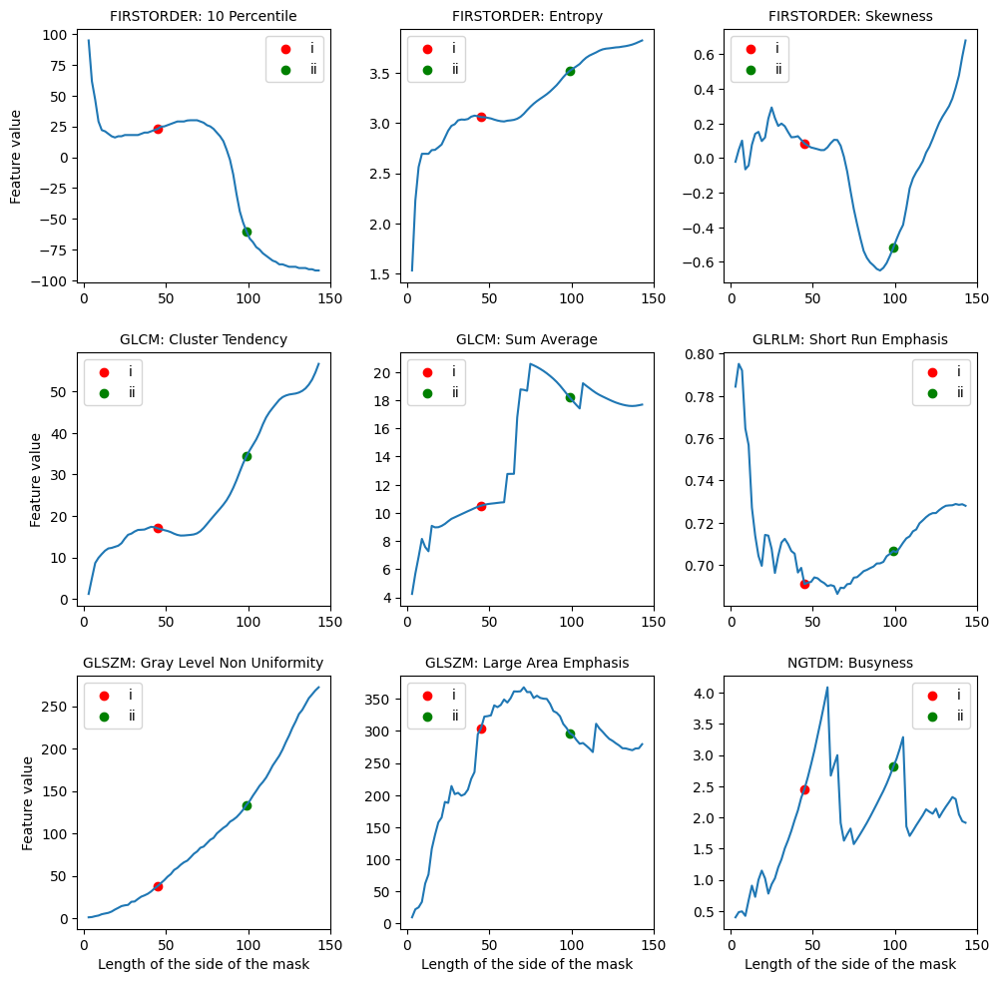

In [32]:
chosen = ['original_firstorder_10Percentile', 'original_firstorder_Entropy', 'original_firstorder_Skewness',
         'original_glcm_ClusterTendency', 'original_glcm_SumAverage', 'original_glrlm_ShortRunEmphasis',
         'original_glszm_GrayLevelNonUniformity', 'original_glszm_LargeAreaEmphasis', 'original_ngtdm_Busyness']

fig, ax = plt.subplots(3, 3, figsize=(10, 10))
#fig.suptitle('Cechy kształtu', fontsize=20, y = 0.92)
fig.tight_layout(pad=2)

for i in range(0, len(chosen)):
    ax[int(i/3), i%3].set_title(fixTitle(chosen[i]), fontsize=10)
    ax[int(i/3), i%3].plot(xAxisValuesShort, resultsShortForPlot[chosen[i]])
    ax[int(i/3), i%3].scatter(45, resultsShortForPlot[chosen[i]][21], marker='o', color='r', label='i')
    ax[int(i/3), i%3].scatter(99, resultsShortForPlot[chosen[i]][48], marker='o', color='g', label='ii')
    ax[int(i/3), i%3].set_box_aspect(1)
    ax[int(i/3), i%3].legend()
    
    if i%3 == 0:
        ax[int(i/3), i%3].set_ylabel("Feature value")
    if i>5:
        ax[int(i/3), i%3].set_xlabel("Length of the side of the mask")

#plt.savefig(os.path.join(resultsPath, 'radiomics-features-graph'), bbox_inches='tight')
plt.show()

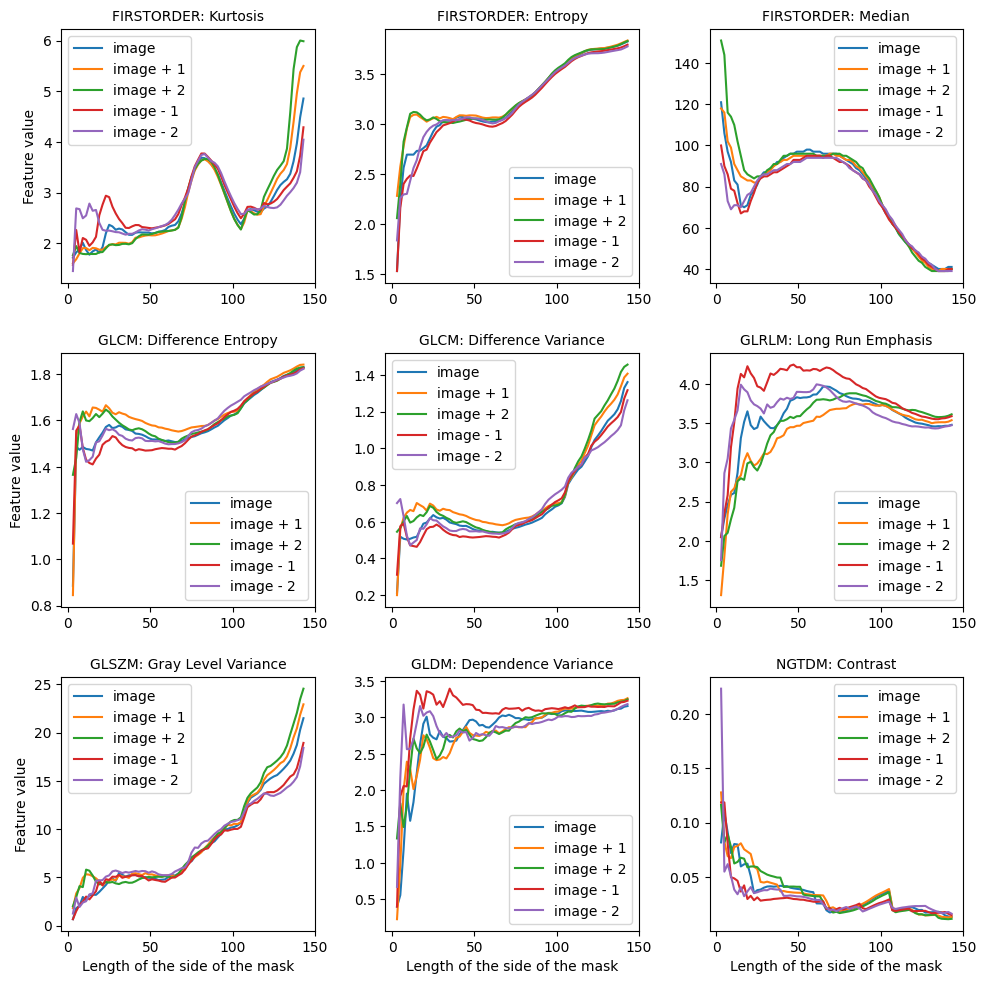

In [33]:
chosen = ['original_firstorder_Kurtosis', 'original_firstorder_Entropy', 'original_firstorder_Median',
         'original_glcm_DifferenceEntropy', 'original_glcm_DifferenceVariance', 'original_glrlm_LongRunEmphasis',
         'original_glszm_GrayLevelVariance', 'original_gldm_DependenceVariance', 'original_ngtdm_Contrast']

fig, ax = plt.subplots(3, 3, figsize=(10, 10))
#fig.suptitle('Cechy kształtu', fontsize=20, y = 0.92)
fig.tight_layout(pad=2)

for i in range(0, len(chosen)):
    ax[int(i/3), i%3].set_title(fixTitle(chosen[i]), fontsize=10)
    for key, value in resultsMultipleImagesForPlot[chosen[i]].items(): 
        ax[int(i/3), i%3].plot(xAxisValuesShort, value, label=fixLegendKey(key))
        
    ax[int(i/3), i%3].set_box_aspect(1)
    ax[int(i/3), i%3].legend()
    
    if i%3 == 0:
        ax[int(i/3), i%3].set_ylabel("Feature value")
    if i>5:
        ax[int(i/3), i%3].set_xlabel("Length of the side of the mask")

#plt.savefig(os.path.join(resultsPath, 'radiomics-features-layers-graph'), bbox_inches='tight')
plt.show()